# Group analysis (DoG)

In [1]:
from linescanning import (
    prf,
    optimal,
    pycortex,
    plotting,
    fitting,
    glm,
    utils
)
from prfpy import model, rf, timecourse
from prfpy.stimulus import PRFStimulus2D
from prfpy.stimulus import *
from prfpy.fit import *
from prfpy.model import *
from prfpy import timecourse
import matplotlib.pyplot as plt
import os
import numpy as np
import cortex
opj = os.path.join
opd = os.path.dirname
import seaborn as sns
import pandas as pd
import scipy.stats as stats
from statsmodels.stats.weightstats import DescrStatsW, ttost_paired
from statsmodels.stats.descriptivestats import Description
from seaborn import regression
import statsmodels.api as sm   
from statsmodels.formula.api import ols

## Functions 

### Profile and add. measures (fwhmax, fwatmin, half max, min profile)

In [2]:
## Profile and add. measures (fwhmax, fwatmin, half max, min profile)
class Add_measures():
    
    'To obtain profile, fwhmax, halfmax, fwatmin, min profile'

    def __init__(
        self, 
        data = None, 
        model = None,
        ecc = True,
        #params=None,  
        # roi = None,
        normalize_RFs = False
        ):
            
        self.data = data
        self.model = model
        #self.params = params
        #self.roi = roi
        self.normalize_RFs = normalize_RFs
        self.ecc = ecc
        
        
        self.fwhmax = []
        self.fwhmin = []
        self.halfmax = []
        self.minprofile = [] 
        self.profile_df = pd.DataFrame()
        
        if self.ecc:
            self.data = self.data[(self.data.ecc > 0.5) & (self.data.ecc < 4.51)] # not including those vooxels with higher ecc - not even for the profile
        
        for index in range(len(self.data)):    
            fwhmaxx, halfmaxx, fwhminn,  minprofilee, profile , self.x = self.fwhmax_fwatmin(model = self.model, 
                                                                                   params = self.data.iloc[index], 
                                                                                   normalize_RFs = self.normalize_RFs)  # fwhmax, half_max, [], [], list(profile.T), x
            
            self.fwhmax.append(float(fwhmaxx))
            self.halfmax.append(float(halfmaxx))
            self.profile_df[index] = profile
            
            if self.model == 'dog':
                self.minprofile.append(float(minprofilee))
                self.fwhmin.append(float(fwhminn))
            
        
        self.data['fwhmax']= self.fwhmax
        self.data['halfmax'] = self.halfmax

        if self.model == 'dog':
            self.data['fwmin'] = self.fwhmin
            self.data['min_profile'] = self.minprofile
            
        
        
    
    def fwhmax_fwatmin(self, model, params, normalize_RFs):
    
        model = model.lower()
        x = np.linspace(-20,20,1000).astype('float32')

        prf = params.prf_ampl * np.exp(-0.5*x[...,np.newaxis]**2 / params.prf_size**2) #params[...,3] * np.exp(-0.5*x[...,np.newaxis]**2 / params[...,2]**2)
        vol_prf =  2*np.pi*params.prf_size**2

        if 'dog' in model or 'norm' in model:
            srf = params.surr_ampl * np.exp(-0.5*x[...,np.newaxis]**2 / params.surr_size**2)
            vol_srf = 2*np.pi*params.surr_size**2

        if normalize_RFs==True:

            if model == 'gauss':
                profile =  prf / vol_prf

            elif model =='dog':
                profile = prf / vol_prf - \
                        srf / vol_srf
        else:
            if model == 'gauss':
                profile = prf
            elif model =='dog':
                profile = prf - srf

        half_max = np.max(profile, axis=0)/2
        
        fwhmax = np.abs(2*x[np.argmin(np.abs(profile-half_max), axis=0)])


        if 'dog' in model or 'norm' in model:

            min_profile = np.min(profile, axis=0)
            
            fwatmin = np.abs(2*x[np.argmin(np.abs(profile-min_profile), axis=0)])

            return fwhmax, fwatmin, half_max, min_profile, list(profile.T), x
        else:
            return fwhmax, half_max, [], [], list(profile.T), x
    
class Add_measures_2d():
    
    'To obtain profile, fwhmax, halfmax, fwatmin, min profile'

    def __init__(
        self, 
        data = None, 
        model = None,
        ecc = True,
        #params=None,  
        # roi = None,
        normalize_RFs = False
        ):
            
        self.data = data
        self.model = model
        #self.params = params
        #self.roi = roi
        self.normalize_RFs = normalize_RFs
        self.ecc = ecc
        
        self.design, self.prf_stim = self.load_dm()
        
        self.fwhmax = []
        self.fwhmin = []
        self.halfmax = []
        self.minprofile = [] 
        self.profilex_df = pd.DataFrame()
        self.profiley_df = pd.DataFrame()
        
        if self.ecc:
            self.data = self.data[(self.data.ecc > 0.5) & (self.data.ecc < 4.51)] # not including those vooxels with higher ecc - not even for the profile
        
        for index in range(len(self.data)):    
            fwhmaxx, halfmaxx, fwhminn,  minprofilee, profilex, profiley , self.x = self.fwhmax_fwatmin(model = self.model, 
                                                                                   params = self.data.iloc[index], 
                                                                                   normalize_RFs = self.normalize_RFs, prf_stim = self.prf_stim)  # fwhmax, half_max, [], [], list(profile.T), x
            
            self.fwhmax.append(float(fwhmaxx))
            self.halfmax.append(float(halfmaxx))
            self.profilex_df[index] = profilex
            self.profiley_df[index] = profiley
            
            if self.model == 'dog':
                self.minprofile.append(float(minprofilee))
                self.fwhmin.append(float(fwhminn))
            
        
        self.data['fwhmax']= self.fwhmax
        self.data['halfmax'] = self.halfmax

        if self.model == 'dog':
            self.data['fwmin'] = self.fwhmin
            self.data['min_profile'] = self.minprofile
            
        
        
    
    def fwhmax_fwatmin(self, model, params, normalize_RFs, prf_stim):
    
        model = model.lower()
        x = np.linspace(-20,20,1000).astype('float32')

        prf = params.prf_ampl * np.exp(-0.5*x[...,np.newaxis]**2 / params.prf_size**2) #params[...,3] * np.exp(-0.5*x[...,np.newaxis]**2 / params[...,2]**2)
        vol_prf =  2*np.pi*params.prf_size**2

        if 'dog' in model or 'norm' in model:
            srf = params.surr_ampl * np.exp(-0.5*x[...,np.newaxis]**2 / params.surr_size**2)
            vol_srf = 2*np.pi*params.surr_size**2

        if normalize_RFs==True:

            if model == 'gauss':
                profile =  prf / vol_prf

            elif model =='dog':
                profile = prf / vol_prf - \
                        srf / vol_srf
        else:
            if model == 'DoG':
                profile = prf
            elif model =='dog':
                profile = prf - srf

        half_max = np.max(profile, axis=0)/2
        
        fwhmax = np.abs(2*x[np.argmin(np.abs(profile-half_max), axis=0)])

        if 'dog' in model or 'norm' in model:

            min_profile = np.min(profile, axis=0)
            
            fwatmin = np.abs(2*x[np.argmin(np.abs(profile-min_profile), axis=0)])
            
            profilex = self.make_prf(model = model, stim = prf_stim, params = params)[0]
            profiley = self.make_prf(model = model, stim = prf_stim, params = params)[1]

            return fwhmax, fwatmin, half_max, min_profile, list(profilex.T), list(profiley.T), x
        else:
            profilex = self.make_prf(model = model, stim = prf_stim, params = params)[0]
            profiley = self.make_prf(model = model, stim = prf_stim, params = params)[1]
            return fwhmax, half_max, [], [], list(profilex.T), list(profiley.T), x
        
    
    def make_prf(self, model, stim, params, mu_x=0, mu_y=0, size=None, resize_pix=None, **kwargs):
        """make_prf

        Create an instantiation of a pRF using the parameters obtained during fitting.

        Parameters
        ----------
        prf_object: prfpy.stimulus.PRFStimulus2D
            representation the pRF in visual space
        mu_x: float
            x-component of pRF. Leave default if you want to create size/response functions
        mu_y: float
            y-component of pRF. Leave default if you want to create size/response functions
        size: float
            size of pRF, optional
        resize_pix: int
            resolution of pRF to resample to. For instance, if you've used a low-resolution design matrix, but you'd like a prettier image, you can set `resize` to something higher than the original (54 >> 270, for example). By default not used.

        Returns
        ----------
        numpy.ndarray
            meshgrid containing Gaussian characteristics of the pRF. Can be plotted with :func:`linescanning.plotting.LazyPRF`

        prf = np.rot90(rf.gauss2D_iso_cart(
            x=prf_object.x_coordinates[..., np.newaxis],
            y=prf_object.y_coordinates[..., np.newaxis],
            mu=(mu_x, mu_y),
            sigma=size,
            normalize_RFs=False).T, axes=(1, 2))
        """
        
        prf = params.prf_ampl[...,np.newaxis,np.newaxis]*np.rot90(
            rf.gauss2D_iso_cart(
                x=stim.x_coordinates[...,np.newaxis],
                y=stim.y_coordinates[...,np.newaxis],
                mu=(params.x, params.y),
                sigma=params.prf_size,
                normalize_RFs=False).T, axes=(1,2))
        
        if model == 'dog':
        
            prf -= params.surr_ampl[...,np.newaxis,np.newaxis]*np.rot90(
                    rf.gauss2D_iso_cart(
                        x=stim.x_coordinates[...,np.newaxis],
                        y=stim.y_coordinates[...,np.newaxis],
                        mu=(params.x, params.y),
                        sigma=params.surr_size,
                        normalize_RFs=False).T, axes=(1,2))
            
        #print(x, y)

        # spatially smooth for visualization
        if isinstance(resize_pix, int):
            prf_squeezed = np.squeeze(prf, axis=0)
            prf = utils.resample2d(prf_squeezed, resize_pix)
        
        # save a bunch of problems if returned array is 2D
        if prf.ndim > 2:
            prf = np.squeeze(prf,axis=0)
            
        return prf
    
    
    def load_dm(cut_volumes = True):

        #### load design matrix ###
        screen_size_cm =39.3
        screen_distance_cm=210
        grid_nr = 20
        TR= 1.5
        
        if cut_volumes:
            n_volumes = 5
        else:
            n_volumes = 0

        design = prf.read_par_file(opj(opd(opd(prf.__file__)), '/data1/projects/Meman1/projects/pilot/code', 'design_task-2R.mat'))

        prf_stim = PRFStimulus2D(screen_size_cm = screen_size_cm,
                                    screen_distance_cm = screen_distance_cm,
                                    design_matrix = design[:, :, n_volumes:], # remove first 5 volumes
                                    TR = TR,
                                    task_names ='2R')
        
        return design, prf_stim


### Load parameters ROI

In [3]:
## Load parameters ROIs
def load_params_roi(sub, roi, model, cv):
    
    if roi != 'v1':
        roi = roi.upper()
    if cv:
        add = '_train-test'
    else:
        add = ''
    
    ### SESSION 2
    prf_fn_s2 = opj("/data1/projects/Meman1/projects/pilot/derivatives/prf",f'sub-{sub}', f"ses-2{add}", f"sub-{sub}_ses-2_task-2R_roi-{roi}_model-{model}_stage-iter_desc-prf_params.pkl") #f"sub-{sub}_ses-2_task-2R_roi-{roi}_model-{model}_stage-iter_desc-prf_params.pkl"
    
    pars_s2 = prf.Parameters(prf.read_par_file(prf_fn_s2), model=model).to_df() #gettig prf parameters 
    #data_s2 = prf.Parameters(prf.read_par_file(prf_fn_s2), model=model).to_df() #gettig prf parameters 
    data_s2 = pars_s2.loc[pars_s2.r2 != 0] 
    #data_s2 = pars_s2.loc[(pars_s2.ecc>0) & (pars_s2.ecc<=5)] # selecting voxels which are true for V1 (whole roi) and ecc higher than 0
    
    data_s2['roi'] = roi
    
    data_s2['session'] = 2
    
    if cv:
        cvrsq_s2 = pd.read_csv(f'/data1/projects/Meman1/projects/pilot/derivatives/prf/sub-{sub}/ses-2{add}/rsqs_{roi}_2_sub{sub}.csv')
        cvrsq_s2.index = data_s2.index
    else:
        cvrsq_s2 = []
    
    ### SESSION 3
    
    prf_fn_s3 = opj("/data1/projects/Meman1/projects/pilot/derivatives/prf",f'sub-{sub}', f"ses-3{add}", f"sub-{sub}_ses-3_task-2R_roi-{roi}_model-{model}_stage-iter_desc-prf_params.pkl") #f"sub-{sub}_ses-2_task-2R_roi-{roi}_model-{model}_stage-iter_desc-prf_params.pkl"
    
    pars_s3 = prf.Parameters(prf.read_par_file(prf_fn_s3), model=model).to_df() #gettig prf parameters 
    #data_s3 = prf.Parameters(prf.read_par_file(prf_fn_s3), model=model).to_df() #gettig prf parameters 
            
    data_s3 = pars_s3.loc[pars_s3.r2 != 0] 
    # data_s3 = pars_s3.loc[(pars_s3.ecc>0) & (pars_s3.ecc<=5)] # selecting voxels which are true for V1 (whole roi) and ecc higher than 0

    data_s3['roi'] = roi
    
    data_s3['session'] = 3
    
    if cv:
        cvrsq_s3 = pd.read_csv(f'/data1/projects/Meman1/projects/pilot/derivatives/prf/sub-{sub}/ses-3{add}/rsqs_{roi}_3_sub{sub}.csv')
        cvrsq_s3.index = data_s3.index
    else:
        cvrsq_s3 = []
    
    if sub in ['003', '004', '007', '012', '016']: # meman session 2
        
        data_s2['ses'] = 'memantine'
        
        data_s3['ses'] = 'placebo'
        
    else:  ## meman in session 3     
        
        data_s3['ses'] = 'memantine'
        
        data_s2['ses'] = 'placebo'

    data = pd.concat([data_s2, data_s3])
    
    data['subject'] = sub
    
    if cv:
        data['rsq_test'] = pd.concat([cvrsq_s2['tc_rsq_test'], cvrsq_s3['tc_rsq_test']])
    
    dataf = Add_measures(data = data, model = model, normalize_RFs = False, ecc = True)
    
    
    #dataf = fwhmax_fwhmin_allvoxels(data = data, model = 'dog', normalize_RFs = False) # calculate fwhmax, fwhmin
    
    #datae = dataf.data[dataf.data.ecc < 5.5]
    
    #datae = dataf[dataf.ecc<5.5]
    
    dataf.data.to_csv(f'/data1/projects/Meman1/projects/pilot/derivatives/prf/sub-{sub}/sub-{sub}_roi-{roi}_{model}_parameters.csv')
    
    # dataf.data contains the whole dataset
    # dataf.profile contains the profile for each voxel
    
    return dataf, cvrsq_s2, cvrsq_s3

#### Load all sbjects class

In [4]:
class AllSubjParams():
    
    '''
    Class to fit specific dog parameter across eccentricity bins for all subjects, using a weighted r2 mean or not (w = True /False) and plot it
        
        y: can be 'yfit'(fitted bins to intercept and slope, estimated using all data) or 'y' (actual data binned)
        
        w: use the weighted mean for r2 or just the mean of the bin . if W = false : median instead of mean is used and no weighted by R2
        
        testprint : show posthoc test parameters or not - it is a ttest using FDR correction
                    ## FDR-corrected post hocs with Cohen's D effect size self.posthoc = pingouin.pairwise_tests(
                    ## uses the parametric ttest() function. If False, use pingouin.wilcoxon() or pingouin.mwu() for paired or unpaired samples, respectively.
                        if 0.01 < p_val < 0.05:txt = "*"
                        elif 0.001 < p_val < 0.01:txt = "**"
                        elif p_val < 0.001:txt = "***"
                    
    It returns a barplot with error of all parameters across both sessions and the points values (bin values). It shows whether differences between sessions for specific parameter are significant or not.
                            
    '''
        
    def __init__(
        self, 
        data=None, 
        par=None, 
        #roi=None, 
        nbins=None, 
        y=None, 
        w=None, 
        figsize=(4,8),
        testprint=False, 
        axs=None,
        **kwargs):
    
    
        ## unify all subjects fitting parameter ###
        
        self.data = data
        self.par = par
        self.rois = data.roi.unique()
        self.nbins = nbins
        self.y = y
        self.w = w
        self.testprint = testprint
        self.figsize = figsize
        self.axs = axs
        self.subjects = data.subject.unique()

        self.regdf = pd.DataFrame()
        
        for sub in self.subjects:
            for roi in self.rois:
                #_, _, self.regr_df, self.x = self.fit_param_bins(
                
                #self.regr_df, self.x = self.fit_param_binss(
                _, _, self.regr_df, self.x = self.fit_param_bins(
                    sub, 
                    roi, 
                    self.par, 
                    self.data[self.data.subject == sub], 
                    self.nbins, 
                    self.w)  
                
                self.regdf = pd.concat([self.regdf, self.regr_df])
                
            self.df = self.regdf[self.regdf.parameter == self.par]
        
        
        if not "ses_short" in list(self.df.columns):
            ses_short = self.df["ses"].values.copy()
            ses_short = np.array([i[:3] for i in ses_short])

            self.df["ses_short"] = ses_short
        
 
        
    def fit_param_bins(self, sub, roi, par, data, nbins, w):
        
        '''
        Function to fit specific dog parameter across eccentricity bins, using a weighted r2 mean or not (w = True /False)
        
        if W = false : median instead of mean is used and no weighted by R2
        '''
        
        binpar ='ecc'#'std_prf_ecc'#'std_size'
        b = np.linspace(0.5, 4.5, nbins)
        x = np.asarray([(b[i]+b[i+1])/2 for i in range(len(b)-1)])
        
        ### data for each session
        s0 = data[(data.roi == roi) & (data.ses == 'placebo')] # data for placebo session(data.subject == sub) & 
        s1 = data[(data.roi == roi) &  (data.ses == 'memantine')] # data for memantine session(data.subject == sub)

    
        ### fitting it to a linear function - estimating intercept and slope ###
        p0 = np.polyfit(s0[binpar], s0[par], 1) # placebo - fitting it to a linear function - finding intercept and slope
        p1 = np.polyfit(s1[binpar], s1[par], 1) # memantine, full = True   - fitting it to a linear function - finding intercept and slope
        
        S0 = sm.add_constant(s0[binpar])
        S1 = sm.add_constant(s1[binpar])
        wp0 = sm.WLS(s0[par], S0, weights=s0['r2']).fit()
        wp1 = sm.WLS(s1[par], S1, weights=s1['r2']).fit()
        #print(wp0.fittedvalues)
        #print(wp0.params)
        
        wyfit0 = np.polyval(wp0.params, x)
        wyfit1 = np.polyval(wp1.params, x)

        ### calculating predicted values ###
        yfit0 = np.polyval(p0, x)
        yfit1 = np.polyval(p1, x)
        
        
        ### get mean values for each bin ###
        y0, std0 = self.return_binned(s0, 
                                        s0[par], 
                                        s0[binpar],
                                        w, 
                                        list(b)) # mean value for the bin - real data

        y1, std1 = self.return_binned(s1, 
                                      s1[par], 
                                      s1[binpar], 
                                      w, 
                                      list(b)) # mean value for each bin - real data
        
        yfit0 = np.polyval(p0, x)
        yfit1 = np.polyval(p1, x)
        
        ### create df with fitted values ###
        
        # df = pd.DataFrame({"fit": np.concatenate(tmp_list), "ix": np.concatenate(tmp_ix), "ses": np.concatenate(tmp_name), "subject": np.concatenate(tmp_subj)})

        regr_df = pd.DataFrame()
        std1 = np.array(std1)
        std0 = np.array(std0)
        regr_df['yfit'] = np.hstack([yfit0, yfit1])
        regr_df['wyfit'] = np.hstack([wyfit0, wyfit1])
        regr_df['y'] = np.hstack([y0, y1])
        regr_df['std'] = np.hstack([std0, std1]) #std of the bin mea    
        #regr_df['ci_l'] = np.hstack([ci_l0, ci_l1]) #std of the bin mean
        regr_df['ses'] = np.hstack([np.repeat('placebo', nbins-1), np.repeat('memantine', nbins-1)])
        regr_df['subject'] = np.repeat(sub, nbins*2-2)
        regr_df['intercept'] = np.hstack([np.repeat(p0[0], nbins-1), np.repeat(p1[0], nbins-1)])    
        regr_df['slope'] = np.hstack([np.repeat(p0[1], nbins-1), np.repeat(p1[1], nbins-1)])
        regr_df['wintercept'] = np.hstack([np.repeat(wp0.params[0], nbins-1), np.repeat(wp1.params[0], nbins-1)])    
        regr_df['wslope'] = np.hstack([np.repeat(wp0.params[1], nbins-1), np.repeat(wp1.params[1], nbins-1)])
        regr_df['diff_fit'] = np.hstack([yfit1-yfit0, yfit1-yfit0]) # memantine - placebo (putting it twice to adjust in df
        regr_df['diff_y'] = np.hstack([y1-y0, y1-y0]) # memantine - placebo (putting it twice to adjust in df
        regr_df['diff_std'] = np.hstack([np.abs(std1-std0), np.abs(std1-std0)]) # memantine - placebo (putting it twice to adjust in df
        regr_df['roi'] = roi
        regr_df['parameter'] = par

        std_resid0 = np.std(y0-yfit0)
        std_resid1 = np.std(y1-yfit1)

        return p0, p1, regr_df, x
    
    
    def fit_param_binss(self, roi, par, data, nbins, w):
        
        '''
        Function to fit specific dog parameter across eccentricity bins, using a weighted r2 mean or not (w = True /False)
        
        We are obtaining the CI of each fit using seaborn regression package
        
        No weighted mean is used here (we only need the fitted differences)
        
        The grid is performed tiny differently (it has 20 values instead of 18 as above)
        '''
        
        binpar ='ecc'#'std_prf_ecc'#'std_size'
        
        b = np.linspace(0.5, 4.5, nbins)
        
        ### data for each session
        s0 = data[(data.roi == roi) & (data.ses == 'placebo')] # data for placebo session(data.subject == sub) & 
        s1 = data[(data.roi == roi)  & (data.ses == 'memantine')] # data for memantine session& (data.subject == sub)

    
        ### fitting it to a linear function - estimating intercept and slope ###
        
        #p0 = np.polyfit(s0[binpar], s0[par], 1) # placebo - fitting it to a linear function - finding intercept and slope

        #p1 = np.polyfit(s1[binpar], s1[par], 1) # memantine, full = True   - fitting it to a linear function - finding intercept and slope

        reg_pla = regression._RegressionPlotter(data = s0, x = 'ecc',  y=par,  x_bins = nbins
                                                , x_ci = None)
        
        reg_mem = regression._RegressionPlotter(data = s1, x = 'ecc',  y=par,  x_bins = nbins
                                                , x_ci = None)

        grid, yhat_pla, err_bands_pla = reg_pla.fit_regression(grid = b) #  return grid, yhat, err_bands
        grid, yhat_mem, err_bands_mem = reg_mem.fit_regression(grid = b) #  return grid, yhat, err_bands

        regr_df = pd.DataFrame()
        regr_df['yfit'] = np.hstack([yhat_pla, yhat_mem])
        regr_df['ci_l'] = np.hstack([err_bands_pla[0], err_bands_mem[0]]) #std of the bin mean
        regr_df['ci_u'] = np.hstack([err_bands_pla[1], err_bands_mem[1]]) #std of the bin mean
        regr_df['ses'] = np.hstack([np.repeat('placebo', nbins), np.repeat('memantine', nbins)])
        #regr_df['subject'] = np.repeat(sub, nbins*2)
        regr_df['diff_fit'] = np.hstack([yhat_mem-yhat_pla, yhat_mem-yhat_pla]) # memantine - placebo (putting it twice to adjust in df)
        regr_df['diff_cil'] = np.hstack([err_bands_mem[0]-err_bands_pla[0], err_bands_mem[0]-err_bands_pla[0]])  # memantine - placebo (putting it twice to adjust in df)
        regr_df['diff_ciu'] = np.hstack([err_bands_mem[1]-err_bands_pla[1], err_bands_mem[1]-err_bands_pla[1]])  # memantine - placebo (putting it twice to adjust in df)
        regr_df['roi'] = roi
        regr_df['parameter'] = par
    
        return regr_df, grid
    
    
    def return_binned(self, data, data_par, binon, w, bins=None, start=None, stop=None, binsize=None, nbins=None):
        
        """
        Bins data according to provided bins. Can provide either a list of bins,
        or start, stop and bin sizes or nbins.

        Equivalent to: scipy.stats.binned_statistic()

        data (1D array) : values to be averaged within a bin
        binon (1D array) : independent values to bin-on (separate from values being averaged)
        bins (list) : list of bins
        start (float) :
        stop (float) :
        binsize (float) :
        nbins (int) :

        Returns
        binned_data (arr)
        
        if W = false : median instead of mean is used and no weighted by R2
        using the wighted mean by r2, the fitting is much closer to it
        
        median is much closer to the fitting as well - avoid outliers having too much influence 
        
        fitting is performed to all data - no bins
        """

        #data=np.asarray(data_par)
        binon=np.asarray(binon)

        assert data_par.ndim,'data must be 1D'

        if not bins and binsize:
            assert start and stop, 'provid list of bins or start and stop values'
            bins=np.arange(start,stop,binsize)
        elif not bins and nbins:
            assert start and stop, 'provid list of bins or start and stop values'
            bins=np.linspace(start,stop,nbins)
        else:
            assert bins, 'provide bins'

        binned = [data_par[(binon >= bins[i]) & (binon<bins[i+1])].median() for i in range(len(bins)-1)] # data=data[par]
        #print(binned)
        std = [data_par[(binon >= bins[i]) & (binon<bins[i+1])].std() for i in range(len(bins)-1)] # not very useful if using the median but good to check outliers?
        
        
        
        if w: # calculate the mean of each bin (made by eccentricity size) by r2 weighted - those voxels with higher explainable variance will have more weight in the mean
            binned = [DescrStatsW(data = data_par[(binon >= bins[i]) & (binon<bins[i+1])], weights = data[(binon >= bins[i]) & (binon<bins[i+1])].r2).mean for i in range(len(bins)-1)]
            std = [DescrStatsW(data = data_par[(binon >= bins[i]) & (binon<bins[i+1])], weights = data[(binon >= bins[i]) & (binon<bins[i+1])].r2).std_mean for i in range(len(bins)-1)]
        
        return np.asarray(binned), std

#### Weighted mean profile

In [5]:
def wmean_profile(param_sub, roi):
    
    '''param_sub: is the object created that returns the data with all parameters and the profile
    
    It computes weighted mean by r2 of the profiles of the subject (point by point) and not the parameter which can be affected by outliers/etc
    '''

    profile_sub = param_sub.profile_df.T[0].apply(pd.Series)  # 10000 values - 
    #convert each point calculated into a column in df

    profile_sub.index = param_sub.data.index # get same indexes to locate
    
    profile_sub['r2'] = param_sub.data.r2

    pla_profile = []
    mem_profile = []
    std_mem = []
    std_pla = []


    for point in range(1000):
        print(profile_sub[param_sub.data.ses == 'placebo'][point])
        print(profile_sub.r2) 
                                                
        std_pla.append(DescrStatsW(data = profile_sub[param_sub.data.ses == 'placebo'][point], 
                            weights = profile_sub[param_sub.data.ses == 'placebo'].r2).std_mean )# standard deviation of the weighted mean
                            
        std_mem.append(DescrStatsW(data = profile_sub[param_sub.data.ses == 'memantine'][point], 
                            weights = profile_sub[param_sub.data.ses == 'memantine'].r2).std_mean) # standard deviation of the weighted mean
        
        pla_profile.append( DescrStatsW(data = profile_sub[param_sub.data.ses == 'placebo'][point], 
                            weights = profile_sub[param_sub.data.ses == 'placebo'].r2).mean )
        
        mem_profile.append( DescrStatsW(data = profile_sub[param_sub.data.ses == 'memantine'][point], 
                            weights = profile_sub[param_sub.data.ses == 'memantine'].r2).mean )
    
    profile = pd.DataFrame({'ses': np.array(param_sub.data.ses.unique()), 
                            'subject': np.hstack([param_sub.data.subject.unique(), param_sub.data.subject.unique()]),
                            'roi': [roi, roi]})
    
    profile = pd.concat([profile, pd.DataFrame([pla_profile, mem_profile])], axis = 1)
    
    return profile, std_pla, std_mem

### (w) Mean of add measures (fwhmax, fwhmin)

Includes option to plot 

In [6]:
def mean_std_weightedr2(parameter, data, plot  = True):

    ''' 
    Function to calculate the mean and std weighted by R2 of the parameters per session and/all subjects

        parameter: parameter we want to obtain the info from
        
        data: all info regarding the parameters
        
        plot = True : if we want to plot the weighted mean and std for each subject

    '''
    
    weighted = pd.DataFrame()
    
    for sub in data.subject.unique():
        
        weightedr2 = pd.DataFrame()
        
        weightedr2['subject'] = np.repeat(sub, 2) # 2 sessions 
    
        for roi in data.roi.unique():
            
            # if theres more than 1 ROI I should concatenate them too ? --> I have put weighted inside this loop (might be solved)
            
            weightedr2['roi'] = np.repeat(roi, 2) # 2 sessions 
            
            weightedr2['ses'] = data.ses.unique() # 'placebo', 'memantine'
            
            stds, means = [], []
         
            for ses in data.ses.unique():
                
                selected_data = data[(data.roi==roi) & (data.ses==ses) & (data.subject==sub)]
                                           
                std = DescrStatsW(selected_data[parameter], 
                                  weights = selected_data.r2).std_mean # standard deviation of the weighted mean
                
                mean = DescrStatsW(selected_data[parameter], 
                                   weights = selected_data.r2).mean
                
                stds.append(std)
                
                means.append(mean)                
                
            weightedr2['mean'] = means
            
            weightedr2['std'] = stds
        
            weighted = pd.concat([weighted, weightedr2])
    
    ###### plotting mean and std of weighted r2 ####
           
    if plot:
        
        roi = np.arange(len(weighted.roi.unique()))
        
        width = 0.35 

        plt.figure(figsize = (15,6))

        p1 = plt.bar(roi, weighted[weighted.ses == 'placebo'].groupby(['roi'])['mean'].mean(), width, color='#cccc', 
                    yerr=weighted[weighted.ses == 'placebo'].groupby(['roi'])['std'].mean(), ecolor = 'black')

        p2 = plt.bar(roi, weighted[weighted.ses == 'memantine'].groupby(['roi'])['mean'].mean(), width, 
                    yerr=weighted[weighted.ses == 'memantine'].groupby(['roi'])['std'].mean(), 
                    bottom =weighted[weighted.ses == 'placebo'].groupby(['roi'])['mean'].mean(), 
                    ecolor = 'black', color = 'indianred')

        plt.xticks(roi, weighted.roi.unique(), fontsize = 15)

        plt.ylabel(f'{parameter}', fontsize = 15)

        plt.xlabel(f'ROI', fontsize = 15)

        plt.title(f'{parameter} weighted mean by R2', fontsize = 15)

        plt.yticks(fontsize = 15)

        plt.legend((p1[0], p2[0]), ('placebo', 'memantine'), fontsize = 15)

    return weighted


## Load all parameters

In [11]:
rois = ['v1', 'v2', 'v3']
subjects = [ '001','005','007', '008', '010', '012'] 
model = 'dog'
cv = False

parameters_subs = pd.DataFrame()
profiles_subs = pd.DataFrame()

for sub in subjects:
    print(sub)
    
    for roi in rois:
        print(roi)
        
        param_sub, _, _ = load_params_roi(sub, roi, model, cv)
    
        parameters_subs = pd.concat([parameters_subs, param_sub.data], axis = 0) #parameters
        
        profile, std_pla, std_mem = wmean_profile(param_sub, roi) # weighted mean of profiles (not parameters)    
        profiles_subs = pd.concat([profiles_subs, profile], axis = 0)

        # plotting.LazyPlot(
        #     ts = [profile.loc[1][3:],
        #           profile.loc[0][3:]],
        #     xx = param_sub.x, # I could reduce it
        #     color = ['indianred', 'black'],
        #     labels = ['memantine', 'placebo'],
        #     title = f'Mean profile sub-{sub} ({roi.upper()})',
        #     x_label = 'x (deg of visual field)',
        #     y_label = f'amplitude - {model} model',
        #     figsize = [10,10],
        #     #markers = [None, '.'],
        #     line_width  = [3,2],
        #     font_size = 30,
        #     #save_as = f"/data1/projects/Meman1/projects/pilot/code/results_images/medianprofile_sub-{sub}_roi-{roi}.jpg"
        #     save_as = f"/data1/projects/Meman1/projects/pilot/code/results_images/wmeanprofile_sub-{sub}_roi-{roi}_{model}.jpg"
            
        # )
        
print(np.unique(parameters_subs.subject))

parameters_subs.to_csv(f'all_subjects_parameters_{model}.csv')

001
v1
768      -4.435874e-09
769      -4.603689e-11
773      -5.053005e-22
774      -3.886207e-13
778      -1.907303e-25
              ...     
295989   -2.161039e-28
296423   -3.342502e-18
296689   -2.816549e-31
298132   -7.248990e-25
298172   -1.719170e-03
Name: 0, Length: 779, dtype: float32
768       0.721891
769       0.741279
773       0.760968
774       0.709658
778       0.726452
            ...   
296689    0.748112
296983    0.662134
297365    0.700033
298132    0.664223
298172    0.660576
Name: r2, Length: 1564, dtype: float64
768      -4.681238e-09
769      -4.954284e-11
773      -6.081365e-22
774      -4.267138e-13
778      -2.375346e-25
              ...     
295989   -2.757449e-28
296423   -3.856835e-18
296689   -3.698950e-31
298132   -8.996879e-25
298172   -1.720511e-03
Name: 1, Length: 779, dtype: float32
768       0.721891
769       0.741279
773       0.760968
774       0.709658
778       0.726452
            ...   
296689    0.748112
296983    0.662134
297365    0.7

In [10]:
dog_parameters = pd.read_csv('/data1/projects/Meman1/projects/pilot/code/def_code/all_subjects_parameters_dog.csv')

#gauss_parameters = pd.read_csv('/data1/projects/Meman1/projects/pilot/code/def_code/all_subjects_parameters_dog.csv')

## Profile

### DoG-TC

Text(0.55, -0.05, 'x (deg. visual field)')

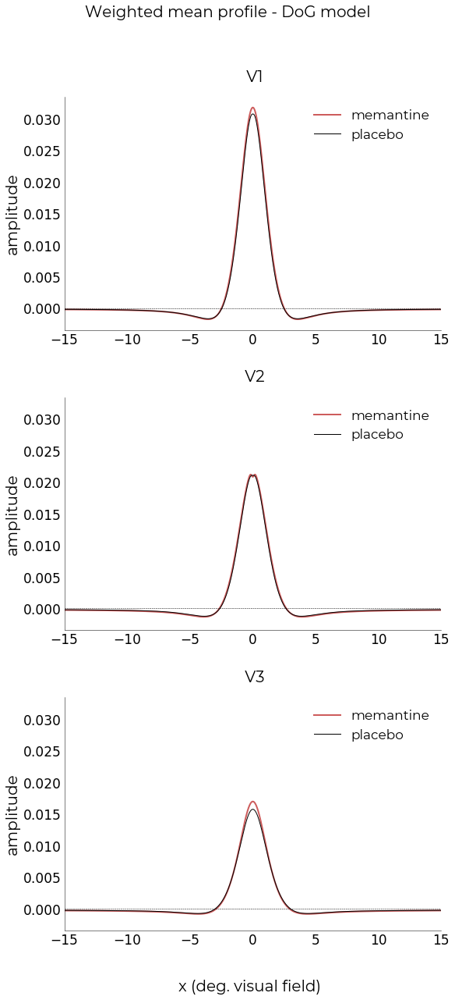

In [12]:
%matplotlib inline
fig,axs = plt.subplots(nrows=3, figsize=(8,16), constrained_layout=True, sharey = True)

# ax1 = fig.add_subplot(gs[0])
# ax2 = fig.add_subplot(gs[1])
# ax3 = fig.add_subplot(gs[2])

for i,roi in enumerate(profiles_subs.roi.unique()):
    profile = profiles_subs[profiles_subs.roi == roi]
    
    mean_mem = profile[profile.ses == 'memantine']
    mean_pla = profile[profile.ses == 'placebo']  
    
    # df_ks = pd.DataFrame()
    # df_ks['Income'] = np.sort(df['Income'].unique())
    # df_ks['F_control'] = df_ks['Income'].apply(lambda x: np.mean(income_c<=x))
    # df_ks['F_treatment'] = df_ks['Income'].apply(lambda x: np.mean(income_t<=x))
    # df_ks.head() 
    
    plotting.LazyPlot(
                ts = [mean_mem.mean()[1:],
                    mean_pla.mean()[1:]],
                xx = param_sub.x, 
                color = ['indianred', 'black'],
                labels = ['memantine', 'placebo'],
                title = f'\n {roi.upper()}',
                #x_label = 'x ',
                y_label = f'amplitude',
                figsize = [4,15],
                axs = axs[i],
                add_hline = 0,
                #markers = ['.', '.'],
                line_width  = [2,1],
                font_size = 20,
                label_size = 17,
                x_lim = [-15,15],
                #y_lim = [-0.007,0.02],
                #save_as = f"/data1/projects/Meman1/projects/pilot/code/results_images/medianprofile_sub-{sub}_roi-{roi}.jpg"
                #save_as = f"/data1/projects/Meman1/projects/pilot/code/results_images/wmeanprofile_allsub_roi-{roi}_{model}.jpg"
                
            )
fig.suptitle('Weighted mean profile - DoG model',y = 1.05, fontsize = 20)
#fig.supylabel(f'amplitude' , fontsize = 13)
fig.supxlabel('x (deg. visual field)', fontsize = 20, y = -.05, x = .55) #
#plt.tight_layout()

## Distribution parameters

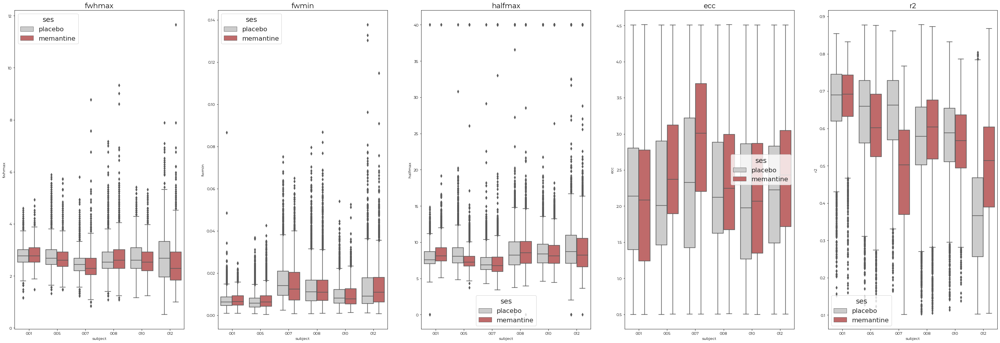

In [13]:
#### DISTRIBUTION OF MAIN PARAMETERS ACROSS V1, SESSION, SUBJECT - eccentricity max set below 5.5####

parameters = ['fwhmax', 'fwmin', 'halfmax', 'ecc','r2' ]#'prf_size', 'prf_ampl','surr_size', 'surr_ampl']#,]#'min_profile',

g = plt.figure(figsize = [45,15])
axes = g.subplots(1,len(parameters))

for i, par in enumerate(parameters):
   
    sns.set(font_scale = 1.5)
    
    sns.set_style("whitegrid")

    sns.boxplot(y= par, x= "subject", hue='ses', data=parameters_subs,  ax = axes[i], palette =['#cccc', 'indianred']).set_title(par)

## Specific distribution for each subject

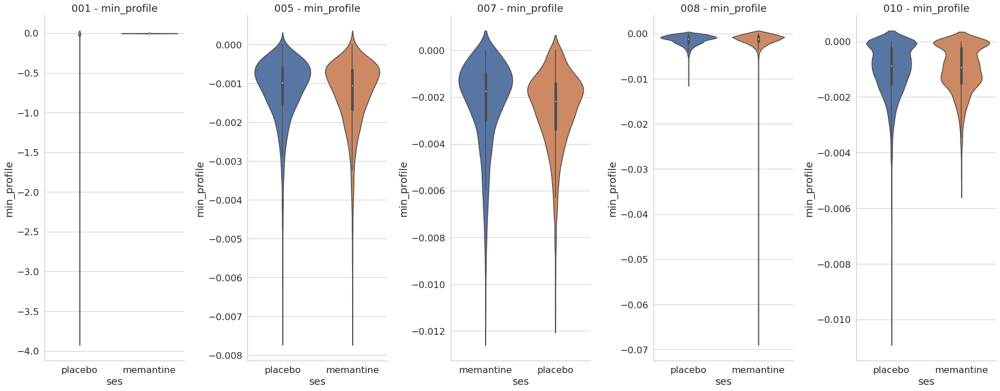

In [14]:
#### SPECIFIC PARAMETER DISTRIBUTION FOR EACH SUBJECT ####

parameters = parameters_subs.columns.drop(['roi', 'session','subject', 'polar', 'ecc', 'r2', 'bold_bsl', 'x', 'y', 'ses'])

param = 'min_profile'

g = plt.figure(figsize = [25,10])
axes = g.subplots(1,5)

for subject, ax in zip(np.unique(parameters_subs.subject), axes.flatten()):
    
    sns.violinplot(y=param, x= "ses",  data=parameters_subs[parameters_subs.subject ==subject], ax=ax).set_title(f'{subject} - {param}')
    #axes.set_ylim([0,0.02])
    sns.despine(ax=ax)

plt.tight_layout()

## Dataset tatistics

In [ ]:
data_stats = parameters_subs.groupby(['subject', 'ses','roi']).describe().T

data_stats.to_csv(f'df_statistics_transpose_{model}.csv')

data_stats

## Effects of memantine

### FWHM

### Each subject fitted

In [7]:
model = 'dog'

parameters_subs = pd.read_csv(f'all_subjects_parameters_{model}.csv')
parameters_subs = parameters_subs[(parameters_subs.subject == 1) | (parameters_subs.subject == 5) | (parameters_subs.subject == 7)]
data = parameters_subs #[(parameters_subs.subject == 1) | (parameters_subs.subject == 5) | (parameters_subs.subject == 7)]
nbins =15
y = 'yfit'
w = True
par = 'fwhmax'

regdf = AllSubjParams(
        data=data, 
        par=par, 
        #roi=roi, 
        nbins=nbins, 
        y=y, 
        w=w, 
        testprint=False,
        fancy=True,
        error="sem",
        sns_offset=4,
        #axs=axs[ix],
        fancy_denom=6,
        label_size=16,
        font_size=20) # points of plot are the bins

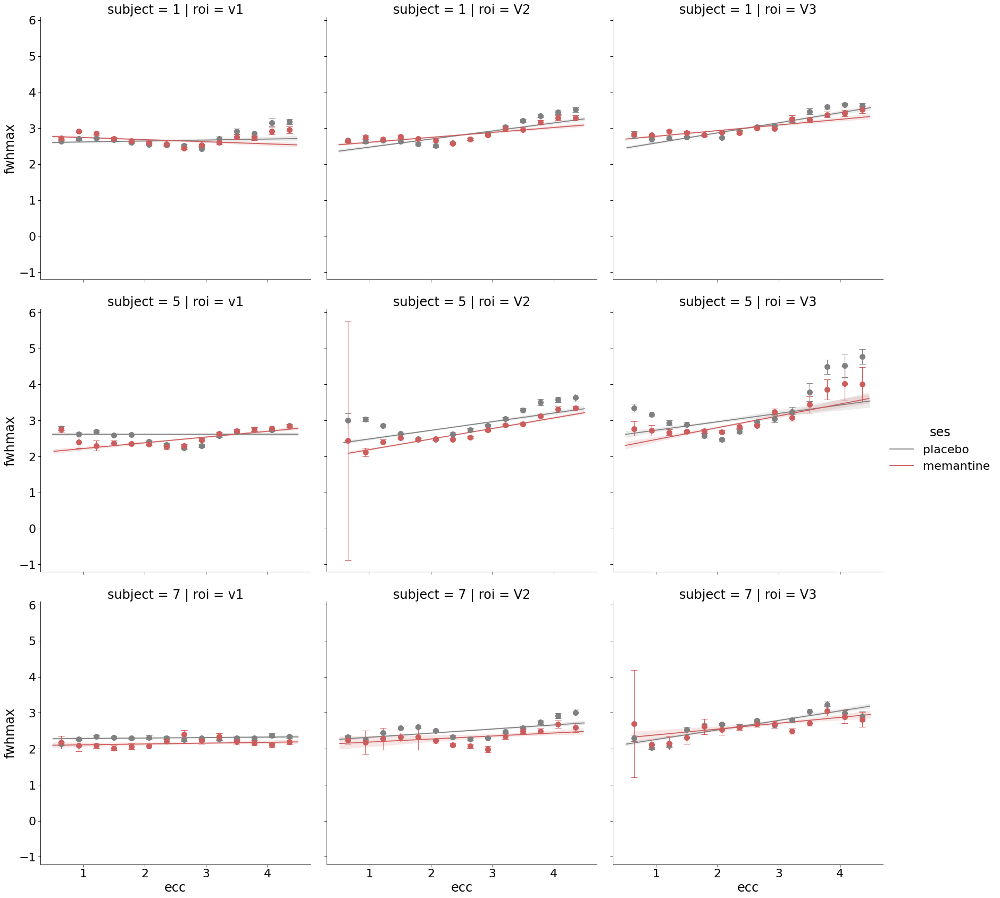

In [16]:
%matplotlib inline
#rois = regdf.df.roi.unique()
pla = regdf.df[regdf.df.ses=='placebo']
mem = regdf.df[regdf.df.ses=='memantine']
#fig,axs = plt.subplots(ncols=1, figsize=(19,8), constrained_layout=True, sharey = True)
parameter = 'fwhmax'

sns.set_context('paper',font_scale=2.5)

a = sns.lmplot(data =  parameters_subs[(parameters_subs.ecc>=0.5) & (parameters_subs.ecc<=4.5)], x='ecc', 
                   y = parameter, row = 'subject', col= 'roi', hue = 'ses',  x_ci = None, palette =['grey','indianred' ], scatter = False, height= 8)

# axs.errorbar(regdf.x, mem[mem.roi== roi].y, yerr=mem[mem.roi== rois[0]]['std'], fmt="o", c='indianred')
#     axs[i].errorbar(regdf.x, pla[pla.roi== roi].y, yerr=pla[pla.roi== roi]['std'], fmt="o", c='#ccc')
#plt.suptitle('FWHM - DoG model \n \n \n', fontsize = 20)

for ix, sub in enumerate(parameters_subs.subject.unique()):
    for i,roi in enumerate(list(parameters_subs.roi.unique())):
        a.axes[ix][i].errorbar(regdf.x, pla[(pla.roi== roi) & (pla.subject== sub)].y, yerr=pla[(pla.roi== roi) & (pla.subject== sub)]['std'], fmt="o", c='grey', markersize = 10, capsize = 6)
        a.axes[ix][i].errorbar(regdf.x, mem[(mem.roi== roi) & (mem.subject== sub)].y, yerr=mem[(mem.roi== roi) & (mem.subject== sub)]['std'], fmt="o", c='indianred', markersize = 10, capsize = 6)

In [8]:
#### rest of subjects
model = 'dog'

parameters_subs = pd.read_csv(f'all_subjects_parameters_{model}.csv')
parameters_subs = parameters_subs[(parameters_subs.subject == 8) | (parameters_subs.subject == 10) | (parameters_subs.subject == 12)]
data = parameters_subs #[(parameters_subs.subject == 1) | (parameters_subs.subject == 5) | (parameters_subs.subject == 7)]
nbins =15
y = 'yfit'
w = True
par = 'fwhmax'

regdf = AllSubjParams(
        data=data, 
        par=par, 
        #roi=roi, 
        nbins=nbins, 
        y=y, 
        w=w, 
        testprint=False,
        fancy=True,
        error="sem",
        sns_offset=4,
        #axs=axs[ix],
        fancy_denom=6,
        label_size=16,
        font_size=20) # points of plot are the bins

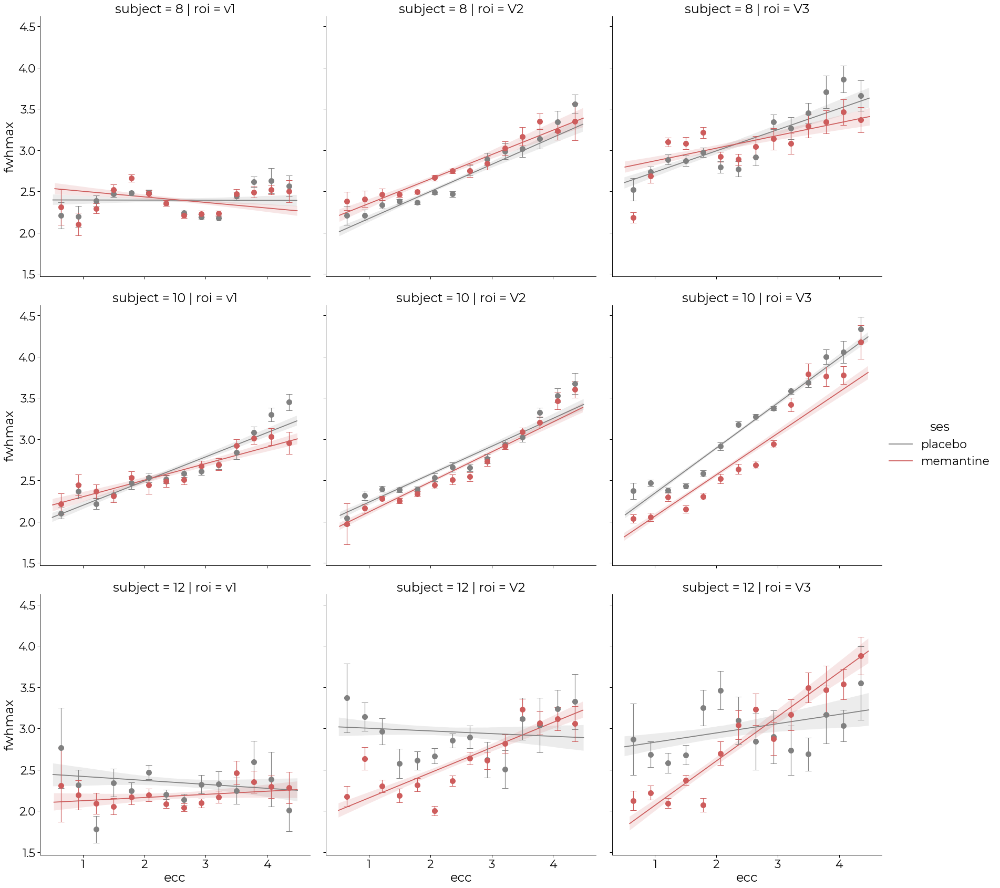

In [55]:
%matplotlib inline
#rois = regdf.df.roi.unique()
pla = regdf.df[regdf.df.ses=='placebo']
mem = regdf.df[regdf.df.ses=='memantine']
#fig,axs = plt.subplots(ncols=1, figsize=(19,8), constrained_layout=True, sharey = True)
parameter = 'fwhmax'

sns.set_context('paper',font_scale=2.5)

a = sns.lmplot(data =  parameters_subs[(parameters_subs.ecc>=0.5) & (parameters_subs.ecc<=4.5)], x='ecc', 
                   y = parameter, row = 'subject', col= 'roi', hue = 'ses',  x_ci = None, palette =['grey','indianred' ], scatter = False, height= 8)

# axs.errorbar(regdf.x, mem[mem.roi== roi].y, yerr=mem[mem.roi== rois[0]]['std'], fmt="o", c='indianred')
#     axs[i].errorbar(regdf.x, pla[pla.roi== roi].y, yerr=pla[pla.roi== roi]['std'], fmt="o", c='#ccc')
#plt.suptitle('FWHM - DoG model \n \n \n', fontsize = 20)

for ix, sub in enumerate(parameters_subs.subject.unique()):
    for i,roi in enumerate(list(parameters_subs.roi.unique())):
        a.axes[ix][i].errorbar(regdf.x, pla[(pla.roi== roi) & (pla.subject== sub)].y, yerr=pla[(pla.roi== roi) & (pla.subject== sub)]['std'], fmt="o", c='grey', markersize = 10, capsize = 6)
        a.axes[ix][i].errorbar(regdf.x, mem[(mem.roi== roi) & (mem.subject== sub)].y, yerr=mem[(mem.roi== roi) & (mem.subject== sub)]['std'], fmt="o", c='indianred', markersize = 10, capsize = 6)

In [9]:
#### all subjects
model = 'dog'

parameters_subs = pd.read_csv(f'all_subjects_parameters_{model}.csv')

data = parameters_subs #[(parameters_subs.subject == 1) | (parameters_subs.subject == 5) | (parameters_subs.subject == 7)]
nbins =15
y = 'yfit'
w = True
par = 'fwhmax'

regdf = AllSubjParams(
        data=data, 
        par=par, 
        #roi=roi, 
        nbins=nbins, 
        y=y, 
        w=w, 
        testprint=False,
        fancy=True,
        error="sem",
        sns_offset=4,
        #axs=axs[ix],
        fancy_denom=6,
        label_size=16,
        font_size=20) # points of plot are the bins

In [10]:
regdf.data

,Unnamed: 0,x,y,prf_size,prf_ampl,bold_bsl,surr_ampl,surr_size,r2,size ratio,...,ecc,polar,roi,session,ses,subject,fwhmax,halfmax,fwmin,min_profile
0,768,1.057127,-2.910016,1.574111,0.010864,0.0,3.105917e-03,3.854846,0.721891,2.448904,...,3.096079,-1.222347,v1,2,placebo,1,3.083083,8.528528,0.003878,-1.407536e-03
1,769,1.069434,-2.628393,1.471227,0.015686,0.0,4.281456e-03,3.301561,0.741279,2.244086,...,2.837629,-1.184375,v1,2,placebo,1,2.922923,7.967968,0.005702,-1.666226e-03
2,773,0.821121,-2.705226,1.953899,0.074699,0.0,6.670145e-02,2.077778,0.760968,1.063401,...,2.827099,-1.276103,v1,2,placebo,1,3.083083,7.887888,0.003998,-1.268638e-03
3,774,0.934750,-2.319835,1.503411,0.017061,0.0,5.519629e-03,2.924982,0.709658,1.945564,...,2.501079,-1.187760,v1,2,placebo,1,2.922923,7.807808,0.005770,-1.679238e-03
4,778,0.466134,-2.473421,1.848670,0.157346,0.0,1.478057e-01,1.907344,0.726452,1.031738,...,2.516961,-1.384524,v1,2,placebo,1,3.003003,7.487487,0.004770,-1.287719e-03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40701,340952,-0.386439,-1.098565,0.883619,0.019639,0.0,6.512735e-04,32.068752,0.441159,36.292523,...,1.164552,-1.909044,V3,3,placebo,12,2.042042,8.128128,0.009491,-6.455639e-04
40702,340981,-2.307750,-0.618014,0.438817,0.052105,0.0,4.279527e-08,2.990479,0.339016,6.814865,...,2.389069,-2.879933,V3,3,placebo,12,1.001001,5.325325,0.026025,-2.826327e-08
40703,341397,-0.585835,-0.271747,1.507700,0.148726,0.0,1.317320e-01,1.596012,0.603650,1.058574,...,0.645793,-2.707270,V3,3,placebo,12,2.522522,6.286286,0.008495,-2.015749e-03
40704,341564,-0.970944,0.961969,0.774908,0.026572,0.0,2.461067e-08,3.009663,0.320651,3.883898,...,1.366791,2.360838,V3,3,placebo,12,1.801802,9.249249,0.013282,-7.067914e-09


### Across all subjects

In [104]:
model = 'dog'

parameters_subs = pd.read_csv(f'all_subjects_parameters_{model}.csv')

data = parameters_subs
nbins =15
y = 'yfit'
w = True
par = 'fwhmax'

regdf = AllSubjParams(
        data=data, 
        par=par, 
        #roi=roi, 
        nbins=nbins, 
        y=y, 
        w=w, 
        testprint=False,
        fancy=True,
        error="sem",
        sns_offset=4,
        #axs=axs[ix],
        fancy_denom=6,
        label_size=16,
        font_size=20) # points of plot are the bins

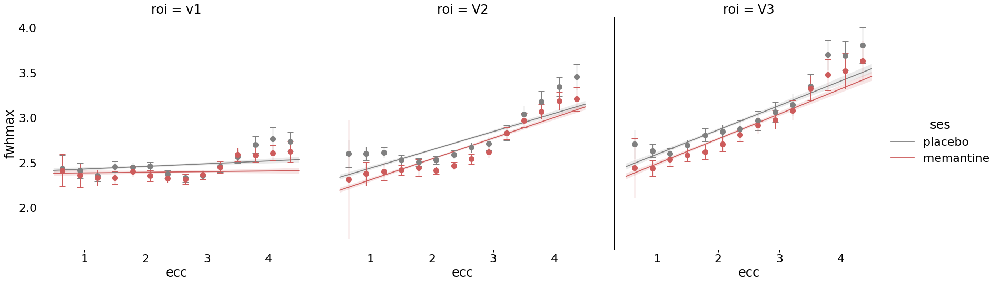

In [19]:
%matplotlib inline
#rois = regdf.df.roi.unique()
pla = regdf.df[regdf.df.ses=='placebo']
mem = regdf.df[regdf.df.ses=='memantine']
#fig,axs = plt.subplots(ncols=1, figsize=(19,8), constrained_layout=True, sharey = True)
parameter = 'fwhmax'

sns.set_context('paper',font_scale=2.5)

a = sns.lmplot(data =  parameters_subs[(parameters_subs.ecc>=0.5) & (parameters_subs.ecc<=4.5)], x='ecc', 
                   y = parameter, col= 'roi', hue = 'ses',  x_ci = None, palette =['grey','indianred' ], scatter = False, height= 8)

# axs.errorbar(regdf.x, mem[mem.roi== roi].y, yerr=mem[mem.roi== rois[0]]['std'], fmt="o", c='indianred')
#     axs[i].errorbar(regdf.x, pla[pla.roi== roi].y, yerr=pla[pla.roi== roi]['std'], fmt="o", c='#ccc')
#plt.suptitle('FWHM - DoG model \n \n \n', fontsize = 20)


for i,roi in enumerate(list(parameters_subs.roi.unique())):
    a.axes[0][i].errorbar(regdf.x, [pla[pla.roi == roi]['y'].loc[i].mean() for i in range(14)], yerr=[pla[pla.roi == roi]['std'].loc[i].mean() for i in range(14)], fmt="o", c='grey', markersize = 10, capsize = 6)
    a.axes[0][i].errorbar(regdf.x, [mem[mem.roi == roi]['y'].loc[i].mean() for i in range(14,28)], yerr=[mem[mem.roi == roi]['std'].loc[i].mean() for i in range(14,28)], fmt="o", c='indianred', markersize = 10, capsize = 6)

### Repeated-measures (subjects) ANOVA (ROI, drug) for weighted-by R2 FWHM  

In [9]:
dog_parameters =  pd.read_csv(f'all_subjects_parameters_{model}.csv')
wfwhmax_dog = mean_std_weightedr2('fwhmax', dog_parameters, plot  = False)

wfwhmax_dog

,subject,roi,ses,mean,std
0,1,v1,placebo,2.641541,0.013135
1,1,v1,memantine,2.681199,0.012671
0,1,V2,placebo,2.795608,0.016311
1,1,V2,memantine,2.797750,0.015324
0,1,V3,placebo,2.927256,0.016366
1,1,V3,memantine,2.935087,0.014539
0,5,v1,placebo,2.597883,0.011825
1,5,v1,memantine,2.517083,0.015467
0,5,V2,placebo,2.817296,0.015052
1,5,V2,memantine,2.658871,0.013435


In [24]:
model = ols('mean ~ C(ses)+C(roi)+C(roi):C(ses)', data=wfwhmax_dog).fit()

anova_table = sm.stats.anova_lm(model, typ=2)
anova_table

,sum_sq,df,F,PR(>F)
C(ses),0.064164,1.0,2.089476,0.158683
C(roi),0.922672,2.0,15.023336,0.000030
C(roi):C(ses),0.005984,2.0,0.097433,0.907449
Residual,0.921238,30.0,NaN,NaN


### Repeated-measure (subjects) ANOVA (ROI, drug) for weighted-by R2 FWHM in eccentricity bin 1.21-1.5 

In [119]:
regdf.regdf[regdf.regdf.ses=='placebo']

,yfit,wyfit,y,std,ses,subject,intercept,slope,wintercept,wslope,diff_fit,diff_y,diff_std,roi,parameter
0,2.603318,1.687736,2.635963,0.031241,placebo,1,0.029208,2.584542,2.570843,0.035052,0.155002,0.079631,0.003787,v1,fwhmax
1,2.611663,2.422263,2.701624,0.034352,placebo,1,0.029208,2.584542,2.570843,0.035052,0.129964,0.216053,0.000009,v1,fwhmax
2,2.620009,3.156789,2.715391,0.034881,placebo,1,0.029208,2.584542,2.570843,0.035052,0.104926,0.137143,0.010763,v1,fwhmax
3,2.628354,3.891315,2.677754,0.032438,placebo,1,0.029208,2.584542,2.570843,0.035052,0.079888,0.032458,0.009014,v1,fwhmax
4,2.636699,4.625842,2.598753,0.031712,placebo,1,0.029208,2.584542,2.570843,0.035052,0.054850,0.044535,0.010492,v1,fwhmax
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9,3.080407,8.529973,2.732887,0.298679,placebo,12,0.112337,2.719326,2.615181,0.124034,0.175747,0.432024,0.110175,V3,fwhmax
10,3.112503,9.277167,2.686782,0.201405,placebo,12,0.112337,2.719326,2.615181,0.124034,0.297124,0.806964,0.018508,V3,fwhmax
11,3.144600,10.024362,3.165862,0.350764,placebo,12,0.112337,2.719326,2.615181,0.124034,0.418502,0.301588,0.057097,V3,fwhmax
12,3.176696,10.771556,3.031108,0.190883,placebo,12,0.112337,2.719326,2.615181,0.124034,0.539880,0.504345,0.009665,V3,fwhmax


In [120]:
print('bins:', regdf.x)
# we take the 3rd bin (1.21 to 1.5) : 2nd position in df
regdf.regdf.loc[2] #placebo (0-14 position) it starts 0 - 13

regdf.regdf.loc[16] # memantine (15-29 position) it starts at 14-27

onepointfive_bin = pd.concat([regdf.regdf.loc[2],regdf.regdf.loc[16]], axis = 0)
onepointfive_bin.head()

bins: [0.64285714 0.92857143 1.21428571 1.5        1.78571429 2.07142857
 2.35714286 2.64285714 2.92857143 3.21428571 3.5        3.78571429
 4.07142857 4.35714286]


,yfit,wyfit,y,std,ses,subject,intercept,slope,wintercept,wslope,diff_fit,diff_y,diff_std,roi,parameter
2,2.620009,3.156789,2.715391,0.034881,placebo,1,0.029208,2.584542,2.570843,0.035052,0.104926,0.137143,0.010763,v1,fwhmax
2,2.518309,2.920618,2.664722,0.037982,placebo,1,0.225893,2.244011,2.202129,0.246604,0.116198,0.022733,0.007995,V2,fwhmax
2,2.644771,3.072894,2.726457,0.035276,placebo,1,0.282229,2.302064,2.292048,0.289693,0.160636,0.179745,0.003850,V3,fwhmax
2,2.615087,3.113060,2.692739,0.031554,placebo,5,0.001082,2.613772,2.545218,0.022437,-0.362941,-0.395230,0.107405,v1,fwhmax
2,2.537509,2.915006,2.855020,0.034694,placebo,5,0.239735,2.246402,2.177250,0.271202,-0.284259,-0.458012,0.042860,V2,fwhmax


In [121]:
model = ols('y ~ C(ses)+C(roi)+C(roi):C(ses)', data=onepointfive_bin).fit()

anova_table = sm.stats.anova_lm(model, typ=2)
anova_table

,sum_sq,df,F,PR(>F)
C(ses),0.087828,1.0,0.931421,0.342210
C(roi),0.324083,2.0,1.718449,0.196530
C(roi):C(ses),0.058078,2.0,0.307957,0.737243
Residual,2.828856,30.0,NaN,NaN


### Repeated-measure (subjects) ANOVA (ROI, drug) for weighted-by R2 FWHM in eccentricity bin 3.21-3.5 

In [124]:
print('bins:', regdf.x)
# we take the 5th to last (3.21-3.5): 9th in df

regdf.regdf.loc[9] #placebo (0-14 position) it starts 0 - 13

regdf.regdf.loc[23] # memantine (15-29 position) it starts at 14-27

threepointfive_bin = pd.concat([regdf.regdf.loc[9],regdf.regdf.loc[23]], axis = 0)
onepointfive_bin.head()

bins: [0.64285714 0.92857143 1.21428571 1.5        1.78571429 2.07142857
 2.35714286 2.64285714 2.92857143 3.21428571 3.5        3.78571429
 4.07142857 4.35714286]


,yfit,wyfit,y,std,ses,subject,intercept,slope,wintercept,wslope,diff_fit,diff_y,diff_std,roi,parameter
2,2.620009,3.156789,2.715391,0.034881,placebo,1,0.029208,2.584542,2.570843,0.035052,0.104926,0.137143,0.010763,v1,fwhmax
2,2.518309,2.920618,2.664722,0.037982,placebo,1,0.225893,2.244011,2.202129,0.246604,0.116198,0.022733,0.007995,V2,fwhmax
2,2.644771,3.072894,2.726457,0.035276,placebo,1,0.282229,2.302064,2.292048,0.289693,0.160636,0.179745,0.003850,V3,fwhmax
2,2.615087,3.113060,2.692739,0.031554,placebo,5,0.001082,2.613772,2.545218,0.022437,-0.362941,-0.395230,0.107405,v1,fwhmax
2,2.537509,2.915006,2.855020,0.034694,placebo,5,0.239735,2.246402,2.177250,0.271202,-0.284259,-0.458012,0.042860,V2,fwhmax


In [125]:
model = ols('y ~ C(ses)+C(roi)+C(roi):C(ses)', data=threepointfive_bin).fit()

anova_table = sm.stats.anova_lm(model, typ=2)
anova_table

,sum_sq,df,F,PR(>F)
C(ses),0.006010,1.0,0.081830,0.776799
C(roi),2.630664,2.0,17.908318,0.000008
C(roi):C(ses),0.006426,2.0,0.043748,0.957256
Residual,2.203443,30.0,NaN,NaN


### t-test for the slope and intercept

In [ ]:
# Performing the paired sample t-test


for roi in regdf.df.roi.unique():
    print(roi)
    print('----SLOPE')
    slopemem = regdf.df[(regdf.df.roi ==roi) & (regdf.df.ses =='memantine')].groupby('subject').mean()['slope']
    slopepla = regdf.df[(regdf.df.roi ==roi) & (regdf.df.ses =='placebo')].groupby('subject').mean()['slope']
    print(stats.ttest_rel(slopemem, slopepla))
    print('------INTER')
    intmem = regdf.df[(regdf.df.roi ==roi) & (regdf.df.ses =='memantine')].groupby('subject').mean()['intercept']
    intpla = regdf.df[(regdf.df.roi ==roi) & (regdf.df.ses =='placebo')].groupby('subject').mean()['intercept']
    print(stats.ttest_rel(intmem, intpla))

#### Difference of fits

<function matplotlib.pyplot.tight_layout(*, pad=1.08, h_pad=None, w_pad=None, rect=None)>

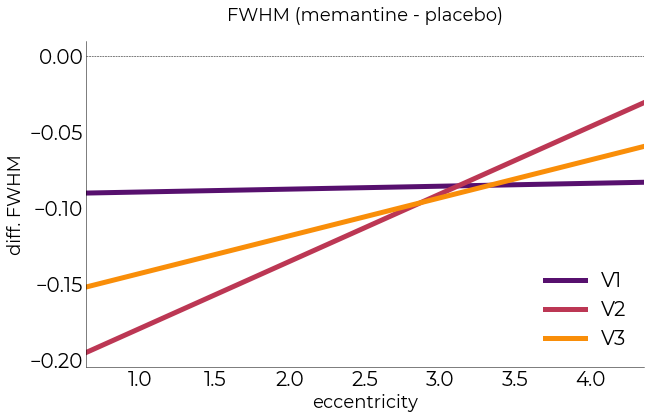

In [13]:
rois = regdf.df.roi.unique()
pla = regdf.df[regdf.df.ses=='placebo']
mem = regdf.df[regdf.df.ses=='memantine']

plotting.LazyPlot(
   ts = [[pla[pla.roi == rois[0]]['diff_fit'].loc[i].mean() for i in range(14)] ,
         [pla[pla.roi == rois[1]]['diff_fit'].loc[i].mean() for i in range(14)] ,
         [pla[pla.roi == rois[2]]['diff_fit'].loc[i].mean() for i in range(14)]
         ],
   xx = regdf.x,
   x_label='eccentricity',
    y_label=f'diff. FWHM',
    title = f'FWHM (memantine - placebo)',
    labels = [ 'V1', 
              'V2', 
              'V3',
                ],
    cmap = 'inferno',
    #color = ['red','orange', 'yellow'],
    # line_width = [0.5, 2, 0.5, 
    #               0.5, 2, 0.5
    #               ,0.5, 2, 0.5,
    #               0.5, 2, 0.5, 
    #                0.5, 2, 0.5,
    #               0.5, 2, 0.5],
#     markers = [, 
#                '.', 
#                '.'],
    #alpha = [0.2, 1, 0.2],
    line_width = 5,
    figsize = [10,6],
    add_hline = 0,
    label_size = 20,
    save_as = f"/data1/projects/Meman1/projects/pilot/code/results_images/difffwhmax_allsub_{model}.jpg"
)
plt.tight_layout

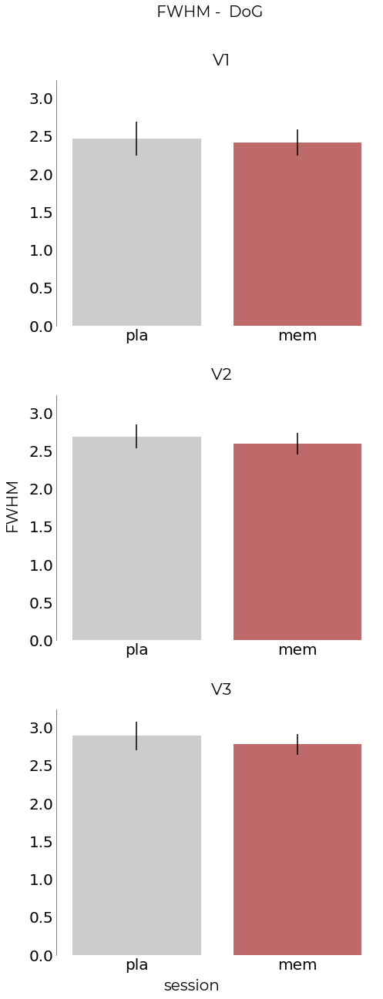

In [10]:
### weighted-by - r2
%matplotlib inline
m_fwmax = mean_std_weightedr2('fwhmax', dog_parameters, plot  = False)
m_fwmax['seshort'] = ['pla', 'mem']*18
m_fwmax['model'] = ['dog']*len(mean_std_weightedr2('fwhmax', dog_parameters, plot  = False))

m_fwmax

fig,axs = plt.subplots(ncols=1, nrows=3, figsize=(7,18), constrained_layout=True, sharey = True)

obj_ = []
for ix,roi in enumerate(dog_parameters.roi.unique()):

        # if roi == 'v1':
        #     cmap = ["#D95F02", 'orange']
        # elif roi == 'V2':
        #     cmap = ['turquoise', 'lightgreen']
        # else:
        #     cmap = ['blue', 'lightblue']
            
        bar_plot = plotting.LazyBar(
            m_fwmax[(m_fwmax.roi == roi)], #[df.subject == sub],
            #hue="ses",
            y='mean',
            x = 'seshort',
            axs=axs[ix], #[i],
            sns_ori = "v",
            #lim=[0,16],
            add_labels=True,
            title2 = f'\n  {roi.upper()}',
            # x_label2 = f'sub-{sub}',
            #cmap = cmap,#["#D95F02", 'turquoise', 'blue'],
            cmap = ["#cccc", "indianred"],
            add_points = False,
            points_color = "k",
            points_alpha = 0.3,
            #y_label2= 'r2',
            points_cmap = "inferno",
            points_hue = "ses",
            font_size = 21,
            label_size  = 20,
            y_lim = [0,6],
            fancy_rounding=8,
            error = 'std' # error is sem (standard error of the mean - it is supposed to be the mean of repeated measure),
            #**kwargs
        )

        ph = glm.Posthoc(
            m_fwmax[m_fwmax.roi == roi], 
            dv='mean', 
            between='seshort', 
            axs=axs[ix], 
            y_pos=.98) ### t test
        
        fig.supylabel('FWHM', fontsize= 20)
        fig.supxlabel('session', fontsize = 20)
        fig.suptitle("         FWHM -  DoG", fontsize=20, y=1)
        
        ph.plot_bars() ## adding significance to the plot for the t test
        plt.tight_layout()
        #print(ph.posthoc_sorted)

### FWMIN

### Each subject fitted

In [14]:
model = 'dog'

parameters_subs = pd.read_csv(f'all_subjects_parameters_{model}.csv')

data = parameters_subs
nbins =15
y = 'yfit'
w = True
par = 'fwmin'

regdf = AllSubjParams(
        data=data, 
        par=par, 
        #roi=roi, 
        nbins=nbins, 
        y=y, 
        w=w, 
        testprint=False,
        fancy=True,
        error="sem",
        sns_offset=4,
        #axs=axs[ix],
        fancy_denom=6,
        label_size=16,
        font_size=20) # points of plot are the bins

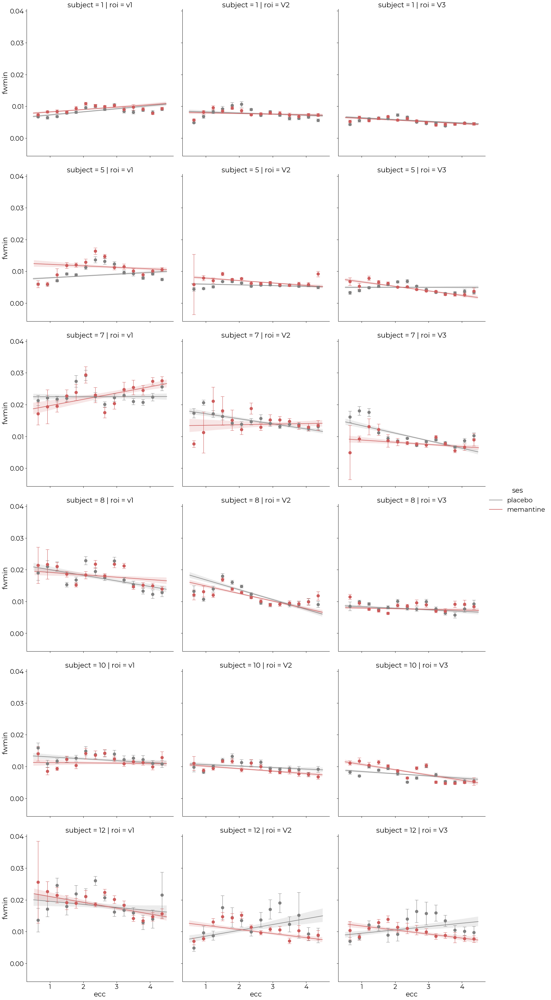

In [15]:
%matplotlib inline
#rois = regdf.df.roi.unique()
pla = regdf.df[regdf.df.ses=='placebo']
mem = regdf.df[regdf.df.ses=='memantine']
#fig,axs = plt.subplots(ncols=1, figsize=(19,8), constrained_layout=True, sharey = True)
parameter = 'fwmin'

sns.set_context('paper',font_scale=2.5)

a = sns.lmplot(data =  parameters_subs[(parameters_subs.ecc>=0.5) & (parameters_subs.ecc<=4.5)], x='ecc', 
                   y = parameter, row = 'subject', col= 'roi', hue = 'ses',  x_ci = None, palette =['grey','indianred' ], scatter = False, height= 8)

# axs.errorbar(regdf.x, mem[mem.roi== roi].y, yerr=mem[mem.roi== rois[0]]['std'], fmt="o", c='indianred')
#     axs[i].errorbar(regdf.x, pla[pla.roi== roi].y, yerr=pla[pla.roi== roi]['std'], fmt="o", c='#ccc')
#plt.suptitle('FWHM - DoG model \n \n \n', fontsize = 20)

for ix, sub in enumerate(parameters_subs.subject.unique()):
    for i,roi in enumerate(list(parameters_subs.roi.unique())):
        a.axes[ix][i].errorbar(regdf.x, pla[(pla.roi== roi) & (pla.subject== sub)].y, yerr=pla[(pla.roi== roi) & (pla.subject== sub)]['std'], fmt="o", c='grey', markersize = 10, capsize = 6)
        a.axes[ix][i].errorbar(regdf.x, mem[(mem.roi== roi) & (mem.subject== sub)].y, yerr=mem[(mem.roi== roi) & (mem.subject== sub)]['std'], fmt="o", c='indianred', markersize = 10, capsize = 6)

### Across all subjects

In [88]:
model = 'dog'

parameters_subs = pd.read_csv(f'all_subjects_parameters_{model}.csv')

data = parameters_subs
nbins =15
y = 'yfit'
w = True
par = 'fwmin'

regdf_min = AllSubjParams(
        data=data, 
        par=par, 
        #roi=roi, 
        nbins=nbins, 
        y=y, 
        w=w, 
        testprint=False,
        fancy=True,
        error="sem",
        sns_offset=4,
        #axs=axs[ix],
        fancy_denom=6,
        label_size=16,
        font_size=20) # points of plot are the bins

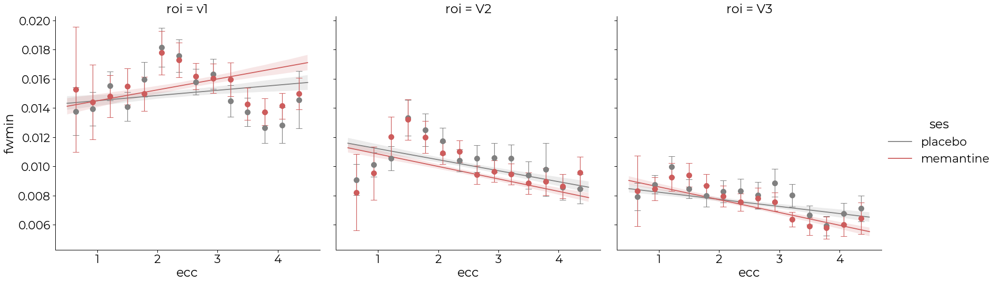

In [89]:
#rois = regdf.df.roi.unique()
pla = regdf_min.df[regdf_min.df.ses=='placebo']
mem = regdf_min.df[regdf_min.df.ses=='memantine']
#fig,axs = plt.subplots(ncols=1, figsize=(19,8), constrained_layout=True, sharey = True)
parameter = 'fwmin'

sns.set_context('paper',font_scale=2.5)

a = sns.lmplot(data =  parameters_subs[(parameters_subs.ecc>=0.5) & (parameters_subs.ecc<=4.5)], x='ecc', 
                   y = parameter, col= 'roi', hue = 'ses',  x_ci = None, palette =['grey','indianred' ], scatter = False, height= 8)

# axs.errorbar(regdf.x, mem[mem.roi== roi].y, yerr=mem[mem.roi== rois[0]]['std'], fmt="o", c='indianred')
#     axs[i].errorbar(regdf.x, pla[pla.roi== roi].y, yerr=pla[pla.roi== roi]['std'], fmt="o", c='#ccc')
#plt.suptitle('FWHM - DoG model \n \n \n', fontsize = 20)


for i,roi in enumerate(list(parameters_subs.roi.unique())):
    a.axes[0][i].errorbar(regdf_min.x, [pla[pla.roi == roi]['y'].loc[i].mean() for i in range(14)], yerr=[pla[pla.roi == roi]['std'].loc[i].mean() for i in range(14)], fmt="o", c='grey', markersize = 10, capsize = 6)
    a.axes[0][i].errorbar(regdf_min.x, [mem[mem.roi == roi]['y'].loc[i].mean() for i in range(14,28)], yerr=[mem[mem.roi == roi]['std'].loc[i].mean() for i in range(14,28)], fmt="o", c='indianred', markersize = 10, capsize = 6)

### Repeated-measures (subjects) ANOVA (ROI, drug) for weighted-R2-FWMIN values

In [86]:
wfwmin_dog = mean_std_weightedr2('fwmin', dog_parameters, plot  = False)
print(wfwmin_dog)
model = ols('mean ~ C(ses)+C(roi)+C(roi):C(ses)', data=wfwmin_dog).fit()

anova_table = sm.stats.anova_lm(model, typ=2)
anova_table

   subject roi        ses      mean       std
0        1  v1    placebo  0.008322  0.000146
1        1  v1  memantine  0.009034  0.000136
0        1  V2    placebo  0.007998  0.000167
1        1  V2  memantine  0.007858  0.000143
0        1  V3    placebo  0.005879  0.000118
1        1  V3  memantine  0.005790  0.000115
0        5  v1    placebo  0.009130  0.000153
1        5  v1  memantine  0.011726  0.000251
0        5  V2    placebo  0.005956  0.000094
1        5  V2  memantine  0.006971  0.000123
0        5  V3    placebo  0.005276  0.000132
1        5  V3  memantine  0.005256  0.000135
0        7  v1    placebo  0.023136  0.000343
1        7  v1  memantine  0.024535  0.000553
0        7  V2    placebo  0.015318  0.000270
1        7  V2  memantine  0.014558  0.000448
0        7  V3    placebo  0.010581  0.000244
1        7  V3  memantine  0.008413  0.000263
0        8  v1    placebo  0.018520  0.000360
1        8  v1  memantine  0.018962  0.000329
0        8  V2    placebo  0.01326

,sum_sq,df,F,PR(>F)
C(ses),1.068207e-07,1.0,0.006118,0.938176
C(roi),3.476347e-04,2.0,9.954703,0.000483
C(roi):C(ses),1.598436e-06,2.0,0.045772,0.955326
Residual,5.238248e-04,30.0,NaN,NaN


### Repeated-measure (subjects) ANOVA (ROI, drug) for weighted-by R2 FWMIN in eccentricity bin 1.21-1.5 

In [126]:
print('bins:', regdf_min.x)
# we take the 3rd bin (1.21 to 1.5) : 2nd position in df
regdf_min.regdf.loc[2] #placebo (0-14 position)

regdf_min.regdf.loc[16] # memantine (15-29 position)

onepointfive_bin = pd.concat([regdf_min.regdf.loc[3],regdf_min.regdf.loc[17]], axis = 0)
onepointfive_bin.head()

bins: [0.64285714 0.92857143 1.21428571 1.5        1.78571429 2.07142857
 2.35714286 2.64285714 2.92857143 3.21428571 3.5        3.78571429
 4.07142857 4.35714286]


,yfit,wyfit,y,std,ses,subject,intercept,slope,wintercept,wslope,diff_fit,diff_y,diff_std,roi,parameter
3,0.007757,0.010534,0.007861,0.000351,placebo,1,0.000966,0.006307,0.006381,0.000962,0.000846,0.000308,0.000021,v1,fwmin
3,0.008053,0.013232,0.009234,0.000763,placebo,1,-0.000350,0.008578,0.009137,-0.000473,-0.000217,-0.000649,0.000043,V2,fwmin
3,0.006104,0.010102,0.006298,0.000382,placebo,1,-0.000539,0.006913,0.007109,-0.000561,-0.000204,-0.000021,0.000062,V3,fwmin
3,0.008255,0.012429,0.009228,0.000379,placebo,5,0.000565,0.007408,0.007951,0.000502,0.003714,0.002666,0.000565,v1,fwmin
3,0.005853,0.009617,0.006802,0.000191,placebo,5,-0.000231,0.006199,0.006591,-0.000269,0.001609,0.002389,0.000353,V2,fwmin


In [127]:
model = ols('y ~ C(ses)+C(roi)+C(roi):C(ses)', data=onepointfive_bin).fit()

anova_table = sm.stats.anova_lm(model, typ=2)
anova_table

,sum_sq,df,F,PR(>F)
C(ses),0.000005,1.0,0.255551,0.616888
C(roi),0.000221,2.0,5.878990,0.007010
C(roi):C(ses),0.000004,2.0,0.094957,0.909684
Residual,0.000565,30.0,NaN,NaN


### Repeated-measure (subjects) ANOVA (ROI, drug) for weighted-by R2 FWMIN in eccentricity bin 3.21-3.5 

In [101]:
print('bins:', regdf_min.x)
# we take the 3rd bin (1.21 to 1.5) : 2nd position in df
regdf_min.regdf.loc[9] #placebo (0-14 position)

regdf_min.regdf.loc[23] # memantine (15-29 position)

threepointfive_bin = pd.concat([regdf_min.regdf.loc[9],regdf_min.regdf.loc[23]], axis = 0)
threepointfive_bin.head()

bins: [0.64285714 0.92857143 1.21428571 1.5        1.78571429 2.07142857
 2.35714286 2.64285714 2.92857143 3.21428571 3.5        3.78571429
 4.07142857 4.35714286]


,yfit,wyfit,y,std,ses,subject,intercept,slope,wintercept,wslope,diff_fit,diff_y,diff_std,roi,parameter
10,0.009690,0.023297,0.008181,0.000510,placebo,1,0.000966,0.006307,0.006381,0.000962,0.000428,0.001534,0.000348,v1,fwmin
10,0.007352,0.031505,0.006131,0.000468,placebo,1,-0.000350,0.008578,0.009137,-0.000473,0.000072,0.001167,0.000119,V2,fwmin
10,0.005025,0.024320,0.003896,0.000307,placebo,1,-0.000539,0.006913,0.007109,-0.000561,-0.000214,0.000382,0.000071,V3,fwmin
10,0.009385,0.028332,0.009303,0.000715,placebo,5,0.000565,0.007408,0.007951,0.000502,0.001637,0.000787,0.000067,v1,fwmin
10,0.005391,0.022799,0.005690,0.000306,placebo,5,-0.000231,0.006199,0.006591,-0.000269,0.000614,-0.000030,0.000104,V2,fwmin


In [102]:
model = ols('y ~ C(ses)+C(roi)+C(roi):C(ses)', data=threepointfive_bin).fit()

anova_table = sm.stats.anova_lm(model, typ=2)
anova_table

,sum_sq,df,F,PR(>F)
C(ses),6.093080e-07,1.0,0.037799,0.847157
C(roi),3.659877e-04,2.0,11.352308,0.000213
C(roi):C(ses),2.996424e-06,2.0,0.092944,0.911506
Residual,4.835859e-04,30.0,NaN,NaN


#### Difference of fits

<function matplotlib.pyplot.tight_layout(*, pad=1.08, h_pad=None, w_pad=None, rect=None)>

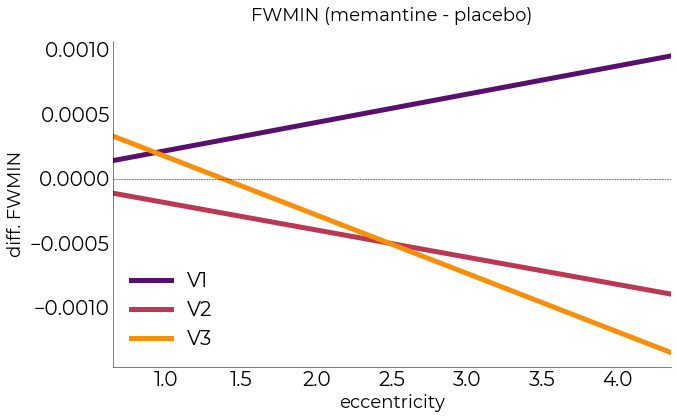

In [18]:
rois = regdf.df.roi.unique()
pla = regdf.df[regdf.df.ses=='placebo']
mem = regdf.df[regdf.df.ses=='memantine']

plotting.LazyPlot(
   ts = [[pla[pla.roi == rois[0]]['diff_fit'].loc[i].mean() for i in range(14)] ,
         [pla[pla.roi == rois[1]]['diff_fit'].loc[i].mean() for i in range(14)] ,
         [pla[pla.roi == rois[2]]['diff_fit'].loc[i].mean() for i in range(14)]
         ],
   xx = regdf.x,
   x_label='eccentricity',
    y_label=f'diff. FWMIN',
    title = f'FWMIN (memantine - placebo)',
    labels = [ 'V1', 
              'V2', 
              'V3',
                ],
    cmap = 'inferno',
    #color = ['red','orange', 'yellow'],
    # line_width = [0.5, 2, 0.5, 
    #               0.5, 2, 0.5
    #               ,0.5, 2, 0.5,
    #               0.5, 2, 0.5, 
    #                0.5, 2, 0.5,
    #               0.5, 2, 0.5],
#     markers = [, 
#                '.', 
#                '.'],
    #alpha = [0.2, 1, 0.2],
    line_width = 5,
    figsize = [10,6],
    add_hline = 0,
    label_size = 20,
    save_as = f"/data1/projects/Meman1/projects/pilot/code/results_images/difffwmin_allsub_{model}.jpg"
)
plt.tight_layout

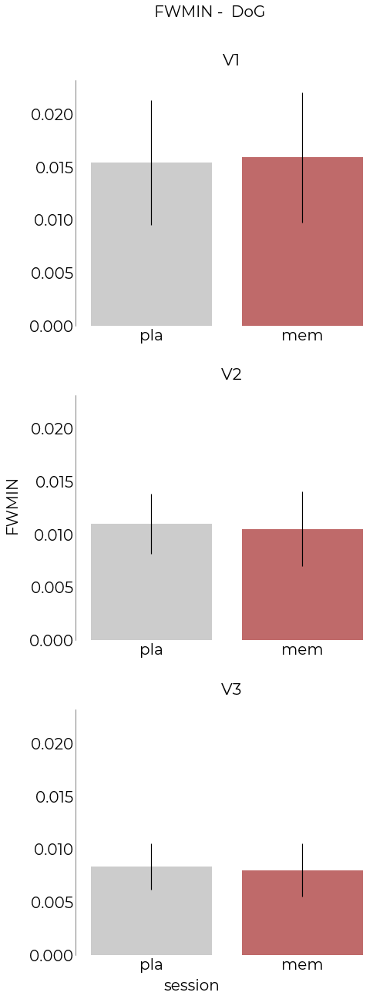

In [33]:
### weighted-by - r2
%matplotlib inline
m_fwmin = mean_std_weightedr2('fwmin', dog_parameters, plot  = False)
m_fwmin['seshort'] = ['pla', 'mem']*18
m_fwmin['model'] = ['dog']*len(mean_std_weightedr2('fwmin', dog_parameters, plot  = False))

m_fwmin

fig,axs = plt.subplots(ncols=1, nrows=3, figsize=(7,18), constrained_layout=True, sharey = True)

obj_ = []
for ix,roi in enumerate(dog_parameters.roi.unique()):

        # if roi == 'v1':
        #     cmap = ["#D95F02", 'orange']
        # elif roi == 'V2':
        #     cmap = ['turquoise', 'lightgreen']
        # else:
        #     cmap = ['blue', 'lightblue']
            
        bar_plot = plotting.LazyBar(
            m_fwmin[(m_fwmin.roi == roi)], #[df.subject == sub],
            #hue="ses",
            y='mean',
            x = 'seshort',
            axs=axs[ix], #[i],
            sns_ori = "v",
            #lim=[0,16],
            add_labels=True,
            title2 = f'\n  {roi.upper()}',
            # x_label2 = f'sub-{sub}',
            #cmap = cmap,#["#D95F02", 'turquoise', 'blue'],
            cmap = ["#cccc", "indianred"],
            add_points = False,
            points_color = "k",
            points_alpha = 0.3,
            #y_label2= 'r2',
            points_cmap = "inferno",
            points_hue = "ses",
            font_size = 21,
            label_size  = 20,
            y_lim = [0,6],
            fancy_rounding=8,
            error = 'std' # error is sem (standard error of the mean - it is supposed to be the mean of repeated measure),
            #**kwargs
        )

        ph = glm.Posthoc(
            m_fwmin[m_fwmin.roi == roi], 
            dv='mean', 
            between='seshort', 
            axs=axs[ix], 
            y_pos=.98) ### t test
        
        fig.supylabel('FWMIN', fontsize= 20)
        fig.supxlabel('session', fontsize = 20)
        fig.suptitle("         FWMIN -  DoG", fontsize=20, y=1)
        
        ph.plot_bars() ## adding significance to the plot for the t test
        plt.tight_layout()
        #print(ph.posthoc_sorted)

# Comparison plots measures for Gaussian - DoG

In [34]:
dog_parameters = pd.read_csv('all_subjects_parameters_dog.csv')

gauss_parameters = pd.read_csv('all_subjects_parameters_gauss.csv')

gauss_parameters.set_index('Unnamed: 0', inplace=True, drop = True) #setting voxel number as index

dog_parameters.set_index('Unnamed: 0', inplace=True, drop = True) #setting voxel number as index

dog_parameters['model']= 'dog'

gauss_parameters['model'] = 'gauss'


parameters = pd.concat([gauss_parameters, dog_parameters], axis = 0)

### R2

In [39]:
m_r2 = pd.concat([mean_std_weightedr2('r2', dog_parameters, plot  = False), 
                      mean_std_weightedr2('r2', gauss_parameters, plot  = False)], axis = 0)
m_r2['seshort'] = ['pla', 'mem']*18 +['pla', 'mem']*18
m_r2['model'] = ['dog']*len(mean_std_weightedr2('r2', dog_parameters, plot  = False))+['gauss']*len(mean_std_weightedr2('r2', dog_parameters, plot  = False))

m_r2.to_csv('r2_tablepersubject.csv')
m_r2.groupby(['model', 'ses']).apply(print)

   subject roi        ses      mean       std seshort model
1        1  v1  memantine  0.717710  0.002942     mem   dog
1        1  V2  memantine  0.676519  0.003424     mem   dog
1        1  V3  memantine  0.672704  0.003385     mem   dog
1        5  v1  memantine  0.676465  0.003945     mem   dog
1        5  V2  memantine  0.612258  0.004187     mem   dog
1        5  V3  memantine  0.579756  0.004635     mem   dog
1        7  v1  memantine  0.576464  0.005026     mem   dog
1        7  V2  memantine  0.533553  0.007691     mem   dog
1        7  V3  memantine  0.439351  0.007778     mem   dog
1        8  v1  memantine  0.659765  0.003348     mem   dog
1        8  V2  memantine  0.605792  0.003684     mem   dog
1        8  V3  memantine  0.578845  0.004628     mem   dog
1       10  v1  memantine  0.524203  0.005409     mem   dog
1       10  V2  memantine  0.574258  0.003420     mem   dog
1       10  V3  memantine  0.613452  0.003265     mem   dog
1       12  v1  memantine  0.556845  0.0

""


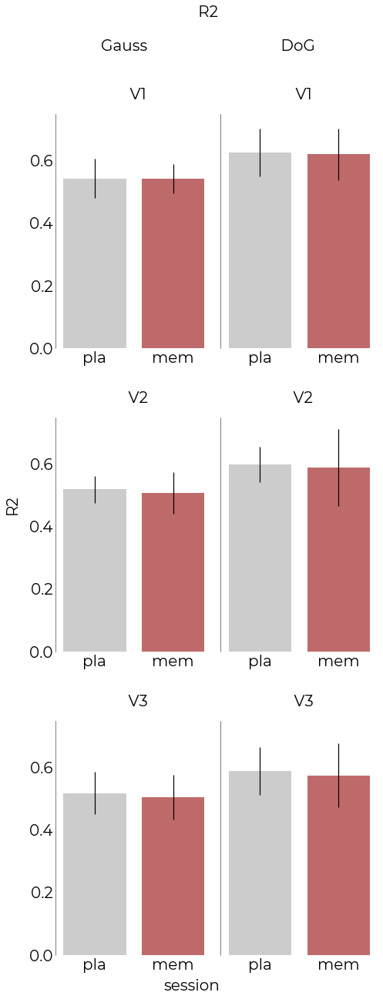

In [72]:
%matplotlib inline
m_fwhmax = pd.concat([mean_std_weightedr2('r2', dog_parameters, plot  = False), 
                      mean_std_weightedr2('r2', gauss_parameters, plot  = False)], axis = 0)
m_fwhmax['seshort'] = ['pla', 'mem']*18 +['pla', 'mem']*18
m_fwhmax['model'] = ['dog']*len(mean_std_weightedr2('r2', dog_parameters, plot  = False))+['gauss']*len(mean_std_weightedr2('r2', dog_parameters, plot  = False))

m_fwhmax

fig,axs = plt.subplots(ncols=2, nrows=3, figsize=(7,18), constrained_layout=True, sharey = True)

obj_ = []
for ix,roi in enumerate(parameters.roi.unique()):
    for i,model in enumerate(parameters.model.unique()):

        # if roi == 'v1':
        #     cmap = ["#D95F02", 'orange']
        # elif roi == 'V2':
        #     cmap = ['turquoise', 'lightgreen']
        # else:
        #     cmap = ['blue', 'lightblue']
            
        bar_plot = plotting.LazyBar(
            m_fwhmax[(m_fwhmax.roi == roi) & (m_fwhmax.model == model)], #[df.subject == sub],
            #hue="ses",
            y='mean',
            x = 'seshort',
            axs=axs[ix,i], #[i],
            sns_ori = "v",
            #lim=[0,16],
            add_labels=True,
            title2 = f'\n  {roi.upper()}',
            # x_label2 = f'sub-{sub}',
            #cmap = cmap,#["#D95F02", 'turquoise', 'blue'],
            cmap = ["#cccc", "indianred"],
            add_points = False,
            points_color = "k",
            points_alpha = 0.3,
            #y_label2= 'r2',
            points_cmap = "inferno",
            points_hue = "ses",
            font_size = 20,
            label_size  = 20,
            y_lim = [0,6],
            fancy_rounding=8,
            #points_color = 'k',
            error = 'std' # error is sem (standard error of the mean - it is supposed to be the mean of repeated measure),
            #**kwargs
        )

        #axs[ix,i].scatter([[x]*len(np.unique(m_fwhmax.subject.values)) for x in [1,2] ], m_fwhmax['mean'][(m_fwhmax['roi']==roi) & (m_fwhmax['model']==model)], c='grey', alpha = 0.25, s=10)#np.unique(m_fwhmax['seshort'])

        ph = glm.Posthoc(
            m_fwhmax[m_fwhmax.roi == roi], 
            dv='mean', 
            between='seshort', 
            axs=axs[ix, i], 
            y_pos=.98) ### t test
        
        fig.supylabel('R2', fontsize= 20)
        fig.supxlabel('session', fontsize = 20)
        fig.suptitle("         R2 \n \n        Gauss                                 DoG", fontsize=20, y=1)
        
        ph.plot_bars() ## adding significance to the plot for the t test
        plt.tight_layout()
        #print(ph.posthoc_sorted)

### FWHM

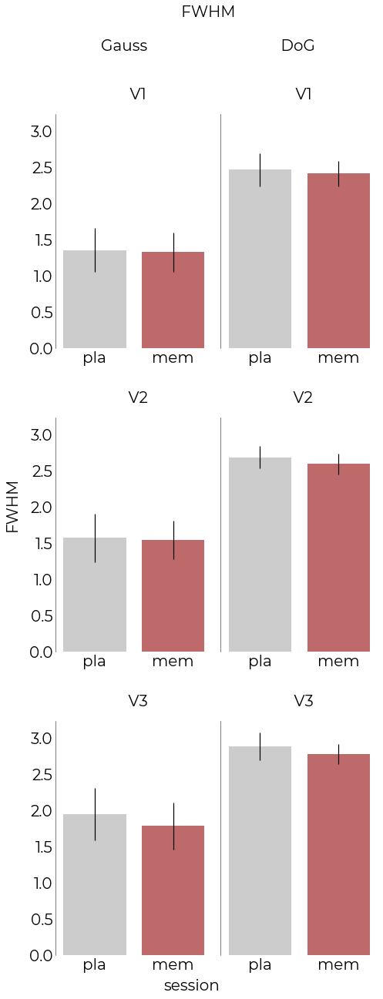

In [45]:
%matplotlib inline
m_fwhmax = pd.concat([mean_std_weightedr2('fwhmax', dog_parameters, plot  = False), 
                      mean_std_weightedr2('fwhmax', gauss_parameters, plot  = False)], axis = 0)
m_fwhmax['seshort'] = ['pla', 'mem']*18 +['pla', 'mem']*18
m_fwhmax['model'] = ['dog']*len(mean_std_weightedr2('fwhmax', dog_parameters, plot  = False))+['gauss']*len(mean_std_weightedr2('fwhmax', dog_parameters, plot  = False))

m_fwhmax

fig,axs = plt.subplots(ncols=2, nrows=3, figsize=(7,18), constrained_layout=True, sharey = True)

obj_ = []
for ix,roi in enumerate(parameters.roi.unique()):
    for i,model in enumerate(parameters.model.unique()):

        # if roi == 'v1':
        #     cmap = ["#D95F02", 'orange']
        # elif roi == 'V2':
        #     cmap = ['turquoise', 'lightgreen']
        # else:
        #     cmap = ['blue', 'lightblue']
            
        bar_plot = plotting.LazyBar(
            m_fwhmax[(m_fwhmax.roi == roi) & (m_fwhmax.model == model)], #[df.subject == sub],
            #hue="ses",
            y='mean',
            x = 'seshort',
            axs=axs[ix,i], #[i],
            sns_ori = "v",
            #lim=[0,16],
            add_labels=True,
            title2 = f'\n  {roi.upper()}',
            # x_label2 = f'sub-{sub}',
            #cmap = cmap,#["#D95F02", 'turquoise', 'blue'],
            cmap = ["#cccc", "indianred"],
            add_points = False,
            points_color = "k",
            points_alpha = 0.3,
            #y_label2= 'r2',
            points_cmap = "inferno",
            points_hue = "ses",
            font_size = 20,
            label_size  = 20,
            y_lim = [0,6],
            fancy_rounding=6,
            error = 'std' # error is sem (standard error of the mean - it is supposed to be the mean of repeated measure),
            #**kwargs
        )

        ph = glm.Posthoc(
            m_fwhmax[m_fwhmax.roi == roi], 
            dv='mean', 
            between='seshort', 
            axs=axs[ix, i], 
            y_pos=.98) ### t test
        
        fig.supylabel('FWHM', fontsize= 20)
        fig.supxlabel('session', fontsize = 20)
        fig.suptitle("         FWHM \n \n        Gauss                                 DoG", fontsize=20, y=1)
        
        ph.plot_bars() ## adding significance to the plot for the t test
        plt.tight_layout()
        #print(ph.posthoc_sorted)